In [1]:
# =============================================================================
# CELDA 1: CARGA DE DATOS Y SANITY CHECK
# =============================================================================
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
from scipy.optimize import curve_fit


warnings.simplefilter('ignore')

# 1. Configuración de Estilo HEP
hep_style = {
    'font.family': 'sans-serif',
    'font.sans-serif': ['Helvetica', 'Arial', 'DejaVu Sans'],
    'xtick.direction': 'in', 'ytick.direction': 'in',
    'xtick.top': True, 'ytick.right': True,
    'xtick.minor.visible': True, 'ytick.minor.visible': True,
    'axes.linewidth': 1.2,
    'legend.frameon': True, 'legend.shadow': True, 'legend.edgecolor': 'black',
    'lines.linewidth': 2, 'lines.markersize': 8,
        # --- LÍNEAS NUEVAS PARA AGRANDAR LOS NÚMEROS ---
    'xtick.labelsize': 14,
    'ytick.labelsize': 14
}
plt.rcParams.update(hep_style)

# Diccionario de colores (Agregalo si no lo tenías definido)
COLORS = {'Proton': 'royalblue', 'Iron': 'firebrick'}

# 2. Funciones Auxiliares
def ang_diff(a, b):
    """Diferencia angular más corta en el rango [-180, 180]"""
    d = a - b
    return (d + 180) % 360 - 180

def ensure_degrees(series):
    """Pasa radianes a grados si es necesario"""
    if series.dropna().abs().max() < 7.0: 
        return np.rad2deg(series)
    return series

def add_physics_annotations(ax):
    """Inyecta los metadatos de la simulación en el gráfico"""
    ax.text(0.95, 0.95, r"$\mathbf{Proton\ showers}$", transform=ax.transAxes, 
            fontsize=12, va='top', ha='right', color=COLORS['Proton'])
    ax.text(0.95, 0.88, r"$\mathbf{SIB2.3e}$", transform=ax.transAxes, 
            fontsize=12, va='top', ha='right', color='purple')
    ax.text(0.95, 0.81, r"$\log_{10}(E_0/\mathrm{eV}) = 17.5 - 18.0$", transform=ax.transAxes, 
            fontsize=11, va='top', ha='right')

folder_path = "/home/lsilva/Github/ADST_Alexey_module_v11/parquet_sib_proton_17/" 

print("Cargando archivos Parquet...")
all_dfs = []
parquets = glob.glob(os.path.join(folder_path, "*.parquet"))
        
for f in parquets:
    try:
        df = pd.read_parquet(f)
        all_dfs.append(df)
    except Exception as e:
        print(f"Error cargando {f}: {e}")

if len(all_dfs) > 0:
    df_guia = pd.concat(all_dfs, ignore_index=True)
    df_infill = df_guia[df_guia['counterId'] >= 100000].copy()
    print(f"Datos cargados exitosamente. Módulos Infill: {len(df_infill):,}")
else:
    print("No se cargaron datos.")
    df_infill = pd.DataFrame()

Cargando archivos Parquet...
Datos cargados exitosamente. Módulos Infill: 734,139


In [2]:
# =============================================================================
# HERRAMIENTA INVESTIGATIVA: GRILLA 5xN DINÁMICA CON AJUSTES (CON TOGGLE MC/REC)
# =============================================================================

def harmonic_model(phi_deg, A1):
    return 1.0 + A1 * np.cos(np.deg2rad(phi_deg))

def ensure_degrees(series):
    """Auxiliar para asegurar que los ángulos estén en grados"""
    if series.dropna().abs().max() < 7.0: 
        return np.rad2deg(series)
    return series

def explorador_grilla_multisenal(df, r_edges, theta_min, theta_max, mode='MC', phi_bins=12):
    """
    Genera la grilla de 5 filas evaluando dinámicamente los bines radiales pasados.
    
    Parámetros nuevos:
    - mode: 'MC' (Usa r_core_MC y phi_MC_Truth para todo) 
            'REC' (Usa r_core y p_rec_cen para todo)
    """
    if mode not in ['MC', 'REC']:
        raise ValueError("El parámetro 'mode' debe ser 'MC' o 'REC'.")

    # 1. Filtro Cenital
    df_theta = df[(df['theta_MC'] >= theta_min) & (df['theta_MC'] < theta_max)].copy()
    print(f"--- Exploración: {theta_min}° <= Theta < {theta_max}° ---")
    print(f"Bines radiales a evaluar: {r_edges}")
    print(f"Eventos en rango angular: {len(df_theta):,}")
    
    if len(df_theta) == 0:
        print("No hay datos para este rango.")
        return
        
    # 2. Preparación Geométrica
    # Calculamos ambos sets de ángulos por las dudas
    euler_mc_true = ensure_degrees(df_theta['phi_plane_euler_MC_true_core'])
    euler_abs = (euler_mc_true - 180) % 360
    df_theta['phi_MC_Truth'] = (euler_abs + 180) % 360 - 180
    
    sp_raw = ensure_degrees(df_theta['phi_plane_sp'])
    phi_rec = ensure_degrees(df_theta['phi_REC'])
    p_rec_absoluto = (sp_raw + phi_rec) % 360
    df_theta['p_rec_cen'] = (p_rec_absoluto + 180) % 360 - 180
    
    # ❗️ EL INTERRUPTOR GEOMÉTRICO ❗️
    if mode == 'MC':
        r_col = 'r_core_MC'
        angle_col = 'phi_MC_Truth'
        print("Modo seleccionado: FULL MC (Usando Core Verdadero y Ángulos Verdaderos)")
    else:
        r_col = 'r_core'
        angle_col = 'p_rec_cen'
        print("Modo seleccionado: FULL REC (Usando Core Reconstruido y Ángulos Reconstruidos)")

    # 3. Configuración de la Grilla (Las 5 señales físicas)
    n_cols = len(r_edges) - 1
    configs = [
        ('nMuones_REC', r'$N_\mu^{\mathrm{REC}}$ (UMD)', 'navy'), 
        ('nMuones_MC', r'$N_\mu^{\mathrm{MC}}$ (UMD)', 'mediumblue'),
        ('sdSignal_REC', r'SD Total (VEM)', 'firebrick'),
        ('sd_nMuons_MC', r'SD Muons (MC)', 'forestgreen'),
        ('sd_nEM_MC', r'SD EM (MC)', 'darkorange')
    ]
    
    fig, axs = plt.subplots(5, n_cols, figsize=(3.5 * n_cols, 14), sharex=True)
    if n_cols == 1: axs = axs[:, np.newaxis] 
        
    phi_bin_edges = np.linspace(-180, 180, phi_bins + 1)
    phi_centers = 0.5 * (phi_bin_edges[1:] + phi_bin_edges[:-1])
    
    resultados = []
    
    for k, (col_name, label, color) in enumerate(configs):
        # Bineamos usando la distancia elegida por el 'mode'
        df_theta['r_bin'] = pd.cut(df_theta[r_col], bins=r_edges, labels=False, include_lowest=True)
        
        for j in range(n_cols):
            ax = axs[k, j]
            df_r = df_theta[df_theta['r_bin'] == j].copy()
            r_min, r_max = r_edges[j], r_edges[j+1]
            
            if df_r.empty or len(df_r.dropna(subset=[col_name])) < 15:
                ax.text(0.5, 0.5, "Baja Est.", ha='center', alpha=0.5, transform=ax.transAxes)
                continue
                
            # Evaluamos la asimetría usando el ángulo elegido por el 'mode'
            df_r['bin_phi'] = pd.cut(df_r[angle_col], bins=phi_bin_edges)
            st = df_r.groupby('bin_phi', observed=False)[col_name].agg(['mean','sem'])
            
            y_means, y_errs = st['mean'].values, st['sem'].values
            norm = np.nanmean(y_means)
            
            if norm == 0 or np.isnan(norm): continue
            
            y_norm = y_means / norm
            y_err_norm = y_errs / norm
            
            # Plot de puntos
            ax.errorbar(phi_centers, y_norm, yerr=y_err_norm, fmt='o', color=color, markersize=6, capsize=3, elinewidth=1.2)
            
            # Fit y Cálculo de Chi2
            valid = ~np.isnan(y_norm) & ~np.isnan(y_err_norm) & (y_err_norm > 0)
            if sum(valid) >= 5:
                try:
                    popt, pcov = curve_fit(harmonic_model, phi_centers[valid], y_norm[valid], sigma=y_err_norm[valid], absolute_sigma=True, bounds=(-2.0, 2.0))
                    A1, A1_err = popt[0], np.sqrt(np.diag(pcov))[0]
                    
                    x_smooth = np.linspace(-180, 180, 100)
                    ax.plot(x_smooth, harmonic_model(x_smooth, A1), '--', color=color, alpha=0.7, linewidth=2)
                    
                    residuals = y_norm[valid] - harmonic_model(phi_centers[valid], A1)
                    chi2_red = np.sum((residuals / y_err_norm[valid])**2) / (len(y_norm[valid]) - 1)
                    
                    texto = f"$A_1$: {A1:.2f} $\pm$ {A1_err:.2f}\n$\chi^2/ndf$: {chi2_red:.1f}"
                    props = dict(boxstyle='round', facecolor='white', alpha=0.7, edgecolor=color)
                    ax.text(0.05, 0.95, texto, transform=ax.transAxes, fontsize=10, va='top', bbox=props)
                    
                    resultados.append({'Mode': mode, 'Signal': col_name, 'r_min': r_min, 'r_max': r_max, 'A1': A1, 'err': A1_err, 'chi2': chi2_red})
                except:
                    pass
            
            # Estética de cada panel
            ax.grid(True, alpha=0.2, linestyle='--')
            ax.axhline(1.0, color='gray', linestyle=':', alpha=0.8)
            ax.set_xlim(-180, 180)
            ax.set_xticks([-180, -90, 0, 90, 180])
            ax.tick_params(axis='both', which='major', labelsize=12)
            ax.set_ylim(0.5, 1.5)

            if k == 0: 
                ax.set_title(f"{r_min} - {r_max} m", fontsize=14, fontweight='bold', pad=12)
            if k == 4: 
                # El label X cambia según el modo
                ax.set_xlabel(rf"$\phi_{{\mathrm{{{mode}}}}}$ [grados]", fontsize=16)
            if j == 0: 
                ax.set_ylabel(f"{label}\nNorm. Amp.", fontsize=11, fontweight='bold', color=color)

    titulo_geom = "Geometría MC Verdadera" if mode == 'MC' else "Geometría Reconstruida"
    fig.suptitle(rf"Infill Asymmetry Grid - {titulo_geom} ($ {theta_min}^\circ \leq \theta < {theta_max}^\circ $)", fontsize=22, fontweight='bold', y=0.96)
    plt.subplots_adjust(hspace=0.15, wspace=0.25)
    plt.show()
    
    return pd.DataFrame(resultados)

--- Exploración: 45° <= Theta < 60° ---
Bines radiales a evaluar: [0, 200, 400, 600, 800, 1000, 1200, 1400]
Eventos en rango angular: 215,304
Modo seleccionado: FULL MC (Usando Core Verdadero y Ángulos Verdaderos)


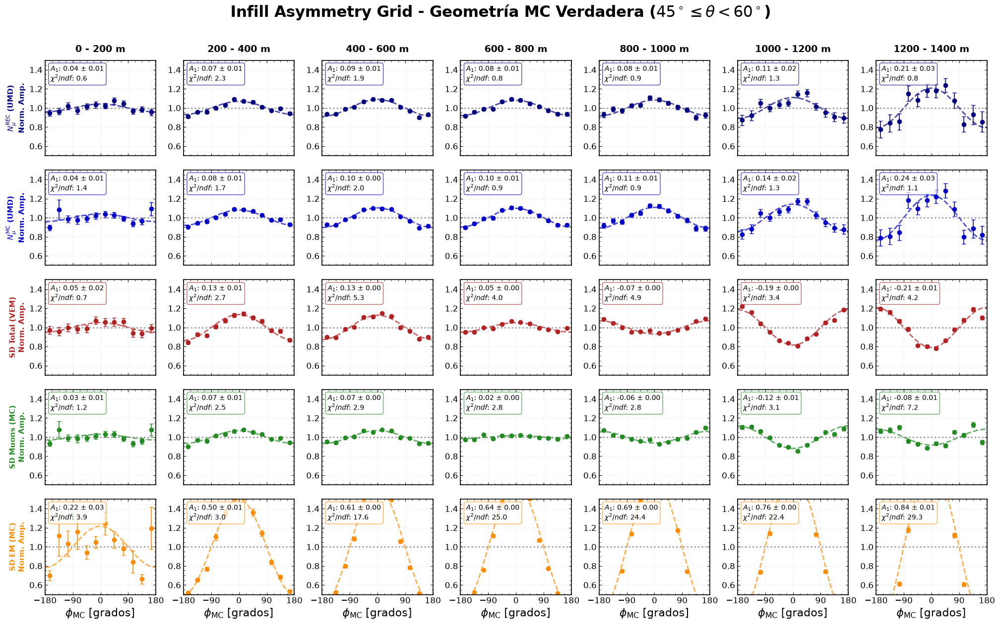

In [3]:
# =============================================================================
# EJEMPLOS DE USO:
# =============================================================================

# Para ver la FÍSICA PURA (Mundo Ideal):
df_res_mc = explorador_grilla_multisenal(df_infill, r_edges=[0, 200, 400, 600, 800, 1000, 1200, 1400], theta_min=45, theta_max=60, mode='MC')

--- Exploración: 45° <= Theta < 60° ---
Bines radiales a evaluar: [0, 150, 300, 450, 600, 750, 900, 1050, 1200, 1350, 1500, 1650, 1800]
Eventos en rango angular: 215,304
Modo seleccionado: FULL MC (Usando Core Verdadero y Ángulos Verdaderos)


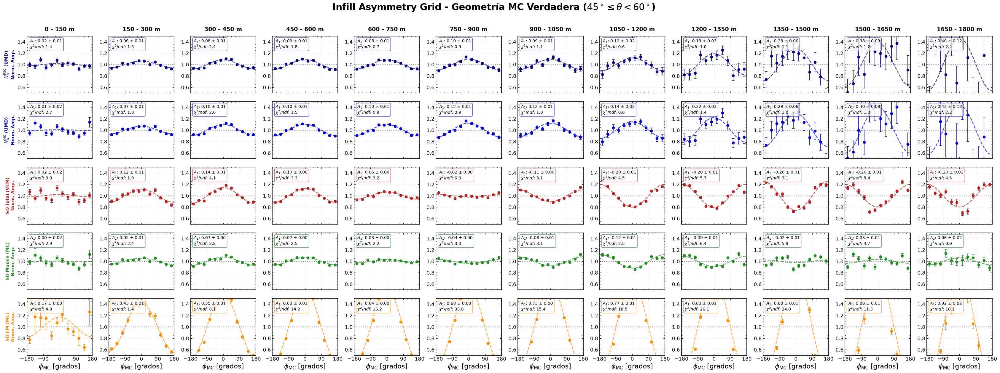

In [4]:
# Para ver la FÍSICA PURA (Mundo Ideal):
df_res_mc = explorador_grilla_multisenal(df_infill, r_edges=[0, 150, 300, 450, 600, 750, 900, 1050, 1200, 1350, 1500, 1650, 1800], theta_min=45, theta_max=60, mode='MC')

--- Exploración: 20° <= Theta < 30° ---
Bines radiales a evaluar: [0, 150, 300, 450, 600, 750, 900, 1050, 1200, 1350, 1500, 1650]
Eventos en rango angular: 132,729
Modo seleccionado: FULL MC (Usando Core Verdadero y Ángulos Verdaderos)


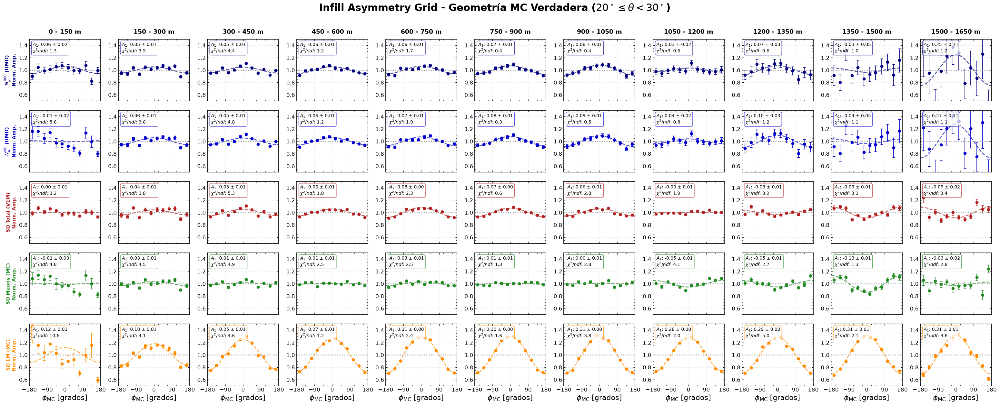

In [5]:
# Para ver la FÍSICA PURA (Mundo Ideal):
df_res_mc = explorador_grilla_multisenal(df_infill, r_edges=[0, 150, 300, 450, 600, 750, 900, 1050, 1200, 1350, 1500, 1650], theta_min=20, theta_max=30, mode='MC')

--- Exploración: 30° <= Theta < 40° ---
Bines radiales a evaluar: [0, 150, 300, 450, 600, 750, 900, 1050, 1200, 1350, 1500, 1650, 1800]
Eventos en rango angular: 156,633
Modo seleccionado: FULL MC (Usando Core Verdadero y Ángulos Verdaderos)


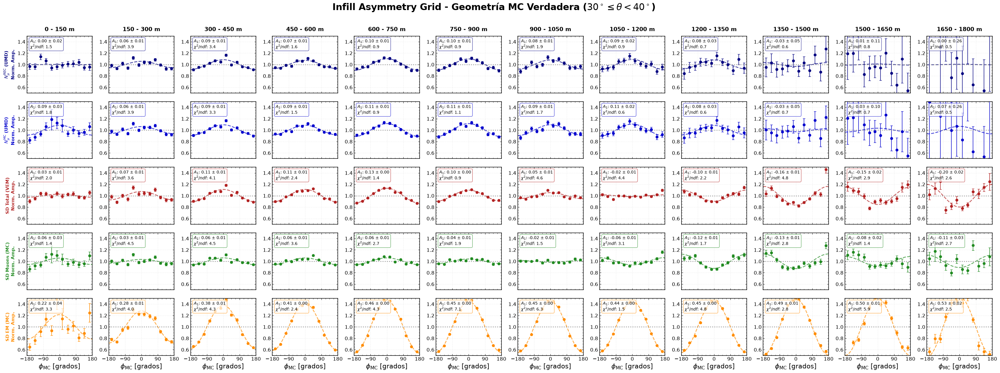

In [6]:
# Para ver la FÍSICA PURA (Mundo Ideal):
df_res_mc = explorador_grilla_multisenal(df_infill, r_edges=[0, 150, 300, 450, 600, 750, 900, 1050, 1200, 1350, 1500, 1650, 1800], theta_min=30, theta_max=40, mode='MC')

--- Exploración: 40° <= Theta < 50° ---
Bines radiales a evaluar: [0, 150, 300, 450, 600, 750, 900, 1050, 1200, 1350, 1500, 1650, 1800]
Eventos en rango angular: 168,711
Modo seleccionado: FULL MC (Usando Core Verdadero y Ángulos Verdaderos)


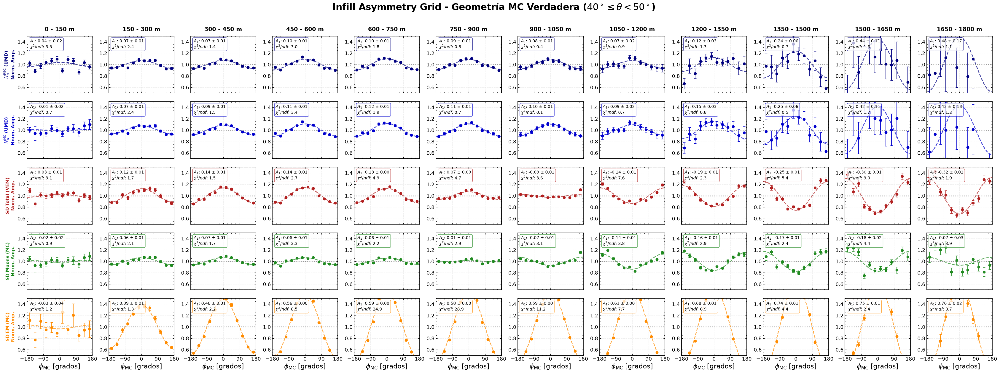

In [7]:
# Para ver la FÍSICA PURA (Mundo Ideal):
df_res_mc = explorador_grilla_multisenal(df_infill, r_edges=[0, 150, 300, 450, 600, 750, 900, 1050, 1200, 1350, 1500, 1650, 1800], theta_min=40, theta_max=50, mode='MC')

--- Exploración: 50° <= Theta < 65° ---
Bines radiales a evaluar: [0, 150, 300, 450, 600, 750, 900, 1050, 1200, 1350, 1500, 1650, 1800]
Eventos en rango angular: 172,713
Modo seleccionado: FULL MC (Usando Core Verdadero y Ángulos Verdaderos)


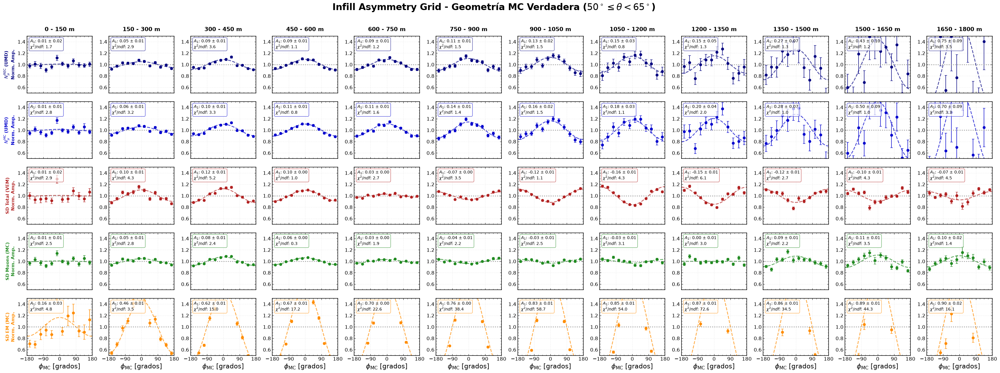

In [8]:
# Para ver la FÍSICA PURA (Mundo Ideal):
df_res_mc = explorador_grilla_multisenal(df_infill, r_edges=[0, 150, 300, 450, 600, 750, 900, 1050, 1200, 1350, 1500, 1650, 1800], theta_min=50, theta_max=65, mode='MC')

--- Exploración: 50° <= Theta < 65° ---
Bines radiales a evaluar: [0, 300, 600, 900, 1200, 1500, 1800]
Eventos en rango angular: 172,713
Modo seleccionado: FULL MC (Usando Core Verdadero y Ángulos Verdaderos)


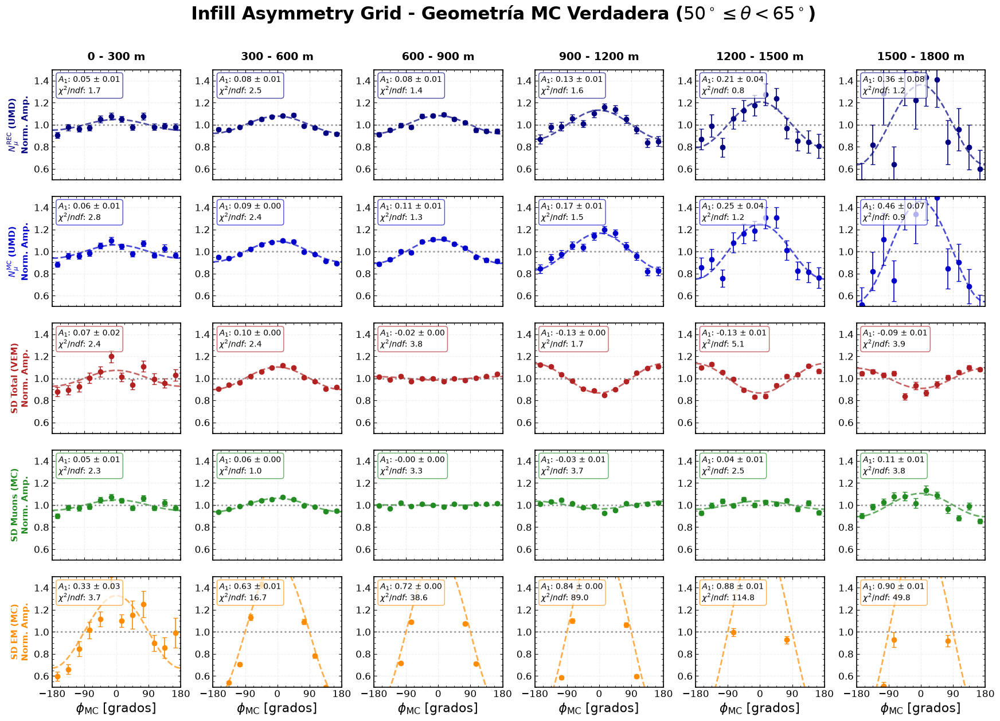

In [9]:
# Para ver el SMEARING DEL DETECTOR (Mundo Real):
df_res_rec = explorador_grilla_multisenal(df_infill, r_edges=[0, 300, 600, 900, 1200, 1500, 1800], theta_min=50, theta_max=65, mode='MC')

--- Exploración: 50° <= Theta < 65° ---
Bines radiales a evaluar: [0, 300, 600, 900, 1200, 1500, 1800]
Eventos en rango angular: 172,713
Modo seleccionado: FULL REC (Usando Core Reconstruido y Ángulos Reconstruidos)


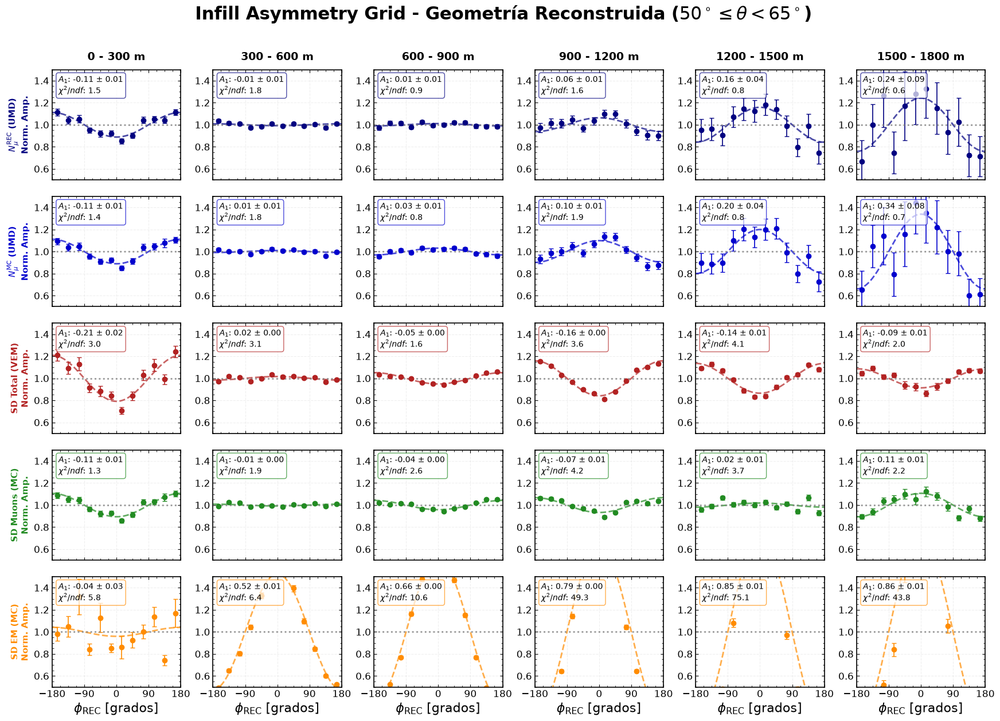

In [10]:
# Para ver el SMEARING DEL DETECTOR (Mundo Real):
df_res_rec = explorador_grilla_multisenal(df_infill, r_edges=[0, 300, 600, 900, 1200, 1500, 1800], theta_min=50, theta_max=65, mode='REC')

--- Exploración: 45° <= Theta < 60° ---
Bines radiales a evaluar: [900, 1000, 1100, 1200, 1300, 1400, 1500, 1600]
Eventos en rango angular: 215,304
Modo seleccionado: FULL REC (Usando Core Reconstruido y Ángulos Reconstruidos)


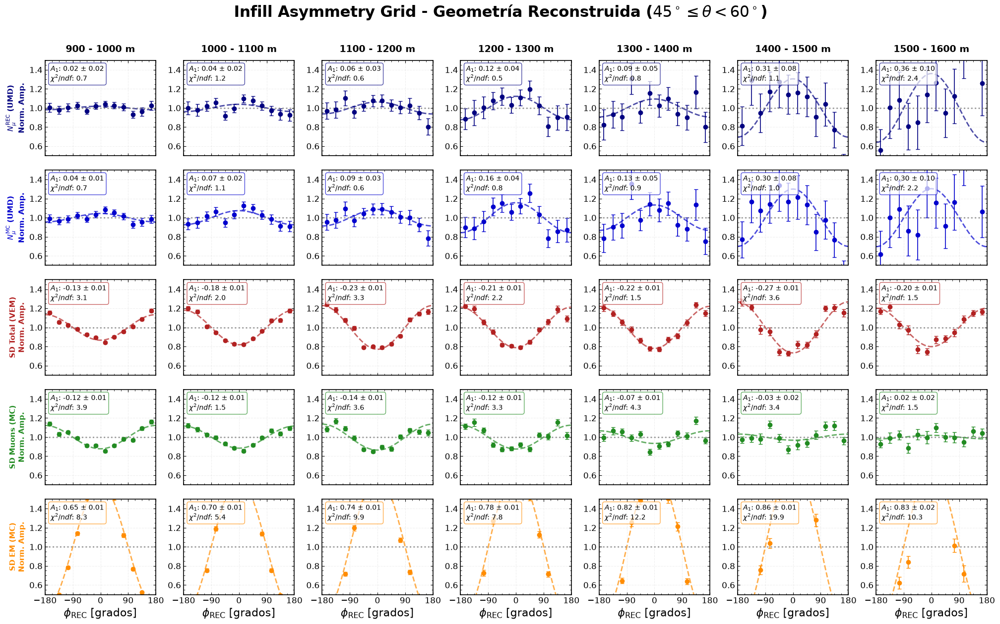

In [11]:
# Para ver el SMEARING DEL DETECTOR (Mundo Real):
df_res_rec = explorador_grilla_multisenal(df_infill, r_edges=[900, 1000, 1100, 1200, 1300, 1400, 1500, 1600], theta_min=45, theta_max=60, mode='REC')

--- Exploración: 50° <= Theta < 65° ---
Bines radiales a evaluar: [900, 1000, 1100, 1200, 1300, 1400, 1500, 1600]
Eventos en rango angular: 172,713
Modo seleccionado: FULL REC (Usando Core Reconstruido y Ángulos Reconstruidos)


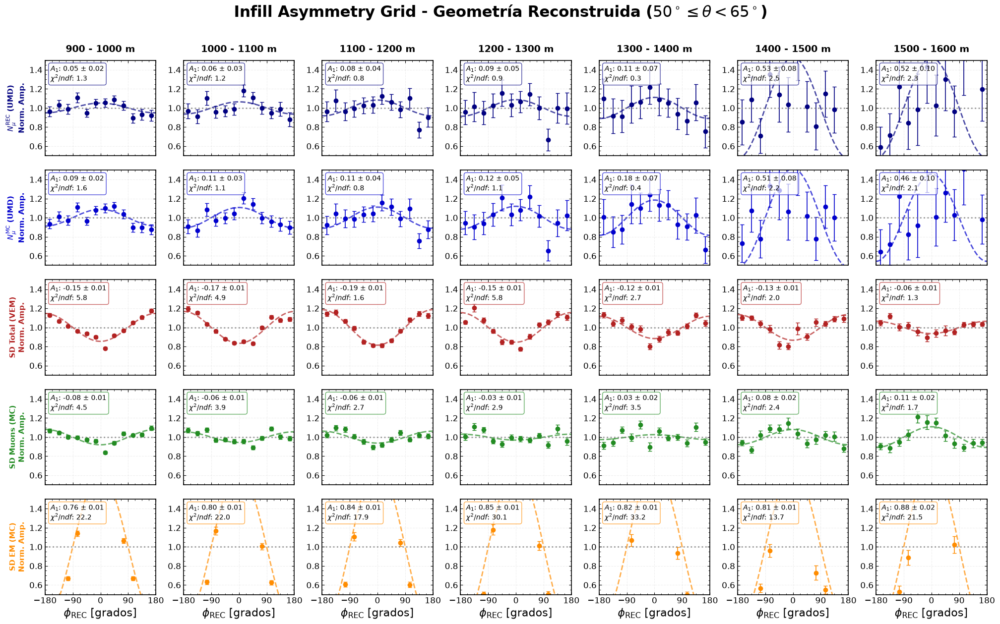

In [12]:
# Para ver el SMEARING DEL DETECTOR (Mundo Real):
df_res_rec = explorador_grilla_multisenal(df_infill, r_edges=[900, 1000, 1100, 1200, 1300, 1400, 1500, 1600], theta_min=50, theta_max=65, mode='REC')

In [13]:
# =============================================================================
# HERRAMIENTA INVESTIGATIVA: GRILLA 5xN ESTILO ANEXO (EN ESPAÑOL + METADATOS)
# =============================================================================

def explorador_grilla_multisenal_v2(df, r_edges, theta_min, theta_max, mode='MC', phi_bins=12):
    """
    Genera la grilla de 5 filas evaluando dinámicamente los bines radiales pasados,
    formateada para el Anexo de la tesis (todo en español, con estilo de publicación).
    """
    if mode not in ['MC', 'REC']:
        raise ValueError("El parámetro 'mode' debe ser 'MC' o 'REC'.")

    # 1. Filtro Cenital
    df_theta = df[(df['theta_MC'] >= theta_min) & (df['theta_MC'] < theta_max)].copy()
    print(f"--- Exploración: {theta_min}° <= Theta < {theta_max}° ---")
    print(f"Bines radiales a evaluar: {r_edges}")
    print(f"Eventos en rango angular: {len(df_theta):,}")
    
    if len(df_theta) == 0:
        print("No hay datos para este rango.")
        return pd.DataFrame()
        
    # 2. Preparación Geométrica
    euler_mc_true = ensure_degrees(df_theta['phi_plane_euler_MC_true_core'])
    euler_abs = (euler_mc_true - 180) % 360
    df_theta['phi_MC_Truth'] = (euler_abs + 180) % 360 - 180
    
    sp_raw = ensure_degrees(df_theta['phi_plane_sp'])
    phi_rec = ensure_degrees(df_theta['phi_REC'])
    p_rec_absoluto = (sp_raw + phi_rec) % 360
    df_theta['p_rec_cen'] = (p_rec_absoluto + 180) % 360 - 180
    
    # Interruptor Geométrico
    if mode == 'MC':
        r_col = 'r_core_MC'
        angle_col = 'phi_MC_Truth'
        print("Modo seleccionado: FULL MC (Usando Core Verdadero y Ángulos Verdaderos)")
    else:
        r_col = 'r_core'
        angle_col = 'p_rec_cen'
        print("Modo seleccionado: FULL REC (Usando Core Reconstruido y Ángulos Reconstruidos)")

    # 3. Configuración de la Grilla (Las 5 señales físicas traducidas)
    n_cols = len(r_edges) - 1
    configs = [
        ('nMuones_REC', r'$N_\mu^{\mathrm{REC}}$ (UMD)', 'navy'), 
        ('nMuones_MC', r'$N_\mu^{\mathrm{MC}}$ (UMD)', 'mediumblue'),
        ('sdSignal_REC', r'SD Total (VEM)', 'firebrick'),
        ('sd_nMuons_MC', r'SD Muones (MC)', 'forestgreen'),
        ('sd_nEM_MC', r'SD EM (MC)', 'darkorange')
    ]
    
    # Aumentamos un poco el alto (16) para dar espacio a las anotaciones globales
    fig, axs = plt.subplots(5, n_cols, figsize=(3.5 * n_cols, 16), sharex=True)
    if n_cols == 1: axs = axs[:, np.newaxis] 
        
    phi_bin_edges = np.linspace(-180, 180, phi_bins + 1)
    phi_centers = 0.5 * (phi_bin_edges[1:] + phi_bin_edges[:-1])
    
    resultados = []
    
    for k, (col_name, label, color) in enumerate(configs):
        df_theta['r_bin'] = pd.cut(df_theta[r_col], bins=r_edges, labels=False, include_lowest=True)
        
        for j in range(n_cols):
            ax = axs[k, j]
            df_r = df_theta[df_theta['r_bin'] == j].copy()
            r_min, r_max = r_edges[j], r_edges[j+1]
            
            if df_r.empty or len(df_r.dropna(subset=[col_name])) < 15:
                ax.text(0.5, 0.5, "Baja\nEstadística", ha='center', va='center', alpha=0.5, transform=ax.transAxes, fontsize=12)
                continue
                
            df_r['bin_phi'] = pd.cut(df_r[angle_col], bins=phi_bin_edges)
            st = df_r.groupby('bin_phi', observed=False)[col_name].agg(['mean','sem'])
            
            y_means, y_errs = st['mean'].values, st['sem'].values
            norm = np.nanmean(y_means)
            
            if norm == 0 or np.isnan(norm): continue
            
            y_norm = y_means / norm
            y_err_norm = y_errs / norm
            
            # Plot de datos experimentales
            ax.errorbar(phi_centers, y_norm, yerr=y_err_norm, fmt='o', color=color, markersize=6, capsize=3, elinewidth=1.2)
            
            # Fit y Cálculo de Chi2
            valid = ~np.isnan(y_norm) & ~np.isnan(y_err_norm) & (y_err_norm > 0)
            if sum(valid) >= 5:
                try:
                    popt, pcov = curve_fit(harmonic_model, phi_centers[valid], y_norm[valid], sigma=y_err_norm[valid], absolute_sigma=True, bounds=(-2.0, 2.0))
                    A1, A1_err = popt[0], np.sqrt(np.diag(pcov))[0]
                    
                    x_smooth = np.linspace(-180, 180, 100)
                    ax.plot(x_smooth, harmonic_model(x_smooth, A1), '--', color=color, alpha=0.8, linewidth=2)
                    
                    residuals = y_norm[valid] - harmonic_model(phi_centers[valid], A1)
                    chi2_red = np.sum((residuals / y_err_norm[valid])**2) / (len(y_norm[valid]) - 1)
                    
                    # ❗️ CAJA DE ESTADÍSTICAS ESTILO REFERENCIA
                    texto = f"Ajuste:\n$A_1$: {A1:.2f} $\pm$ {A1_err:.2f}\n$\chi^2/ndf$: {chi2_red:.1f}"
                    props = dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.9, edgecolor='gray')
                    ax.text(0.05, 0.95, texto, transform=ax.transAxes, fontsize=12, va='top', bbox=props)
                    
                    resultados.append({'Mode': mode, 'Signal': col_name, 'r_min': r_min, 'r_max': r_max, 'A1': A1, 'err': A1_err, 'chi2': chi2_red})
                except:
                    pass
            
            # ❗️ ESTÉTICA Y GRILLAS ESTILO REFERENCIA
            ax.minorticks_on()
            ax.grid(True, which='major', linestyle='-', alpha=0.5)
            ax.grid(True, which='minor', linestyle=':', alpha=0.3)
            
            ax.axhline(1.0, color='gray', linestyle=':', alpha=0.8)
            ax.set_xlim(-180, 180)
            ax.set_xticks([-180, -90, 0, 90, 180])
            ax.tick_params(axis='both', which='major', labelsize=12)
            ax.set_ylim(0.8, 1.2)

            # Etiquetas en español
            if k == 0: 
                ax.set_title(f"{r_min} - {r_max} m", fontsize=15, fontweight='bold', pad=12)
            if k == 4: 
                ax.set_xlabel(rf"$\phi_{{\mathrm{{{mode}}}}}$ [grados]", fontsize=16)
            if j == 0: 
                ax.set_ylabel(f"{label}\nAmp. Norm.", fontsize=13, fontweight='bold', color=color)
                
    # ❗️ TÍTULO Y ANOTACIONES FÍSICAS GLOBALES
    titulo_geom = "Geometría MC Verdadera" if mode == 'MC' else "Geometría Reconstruida"
    
    # 1. Título principal
    fig.suptitle(rf"Arreglo Infill: Análisis Multiseñal - {titulo_geom} ($ {theta_min}^\circ \leq \theta < {theta_max}^\circ $)", 
                 fontsize=26, fontweight='bold', y=0.97)
    
    # 2. Metadatos físicos como subtítulo centrado (mucho más limpio)
    subtitulo = r"$\mathbf{Lluvias\ de\ Protones\ (SIB2.3e)}$   $\bullet$   $\log_{10}(E_0/\mathrm{eV}) = 17.5 - 18.0$"
    fig.text(0.5, 0.935, subtitulo, fontsize=18, va='top', ha='center', color='dimgray')

    # 3. Ajustamos el margen superior para que respire bien el encabezado
    plt.subplots_adjust(top=0.88, hspace=0.15, wspace=0.25)
    
    # Guardado automático con nombre dinámico
    plt.savefig(f'Anexo_Grilla_{mode}_{theta_min}_{theta_max}.pdf', dpi=300, bbox_inches='tight')
    plt.show()
    
    return pd.DataFrame(resultados)

--- Exploración: 40° <= Theta < 50° ---
Bines radiales a evaluar: [0, 150, 300, 450, 600, 750, 900, 1050, 1200, 1350, 1500, 1650]
Eventos en rango angular: 168,711
Modo seleccionado: FULL REC (Usando Core Reconstruido y Ángulos Reconstruidos)


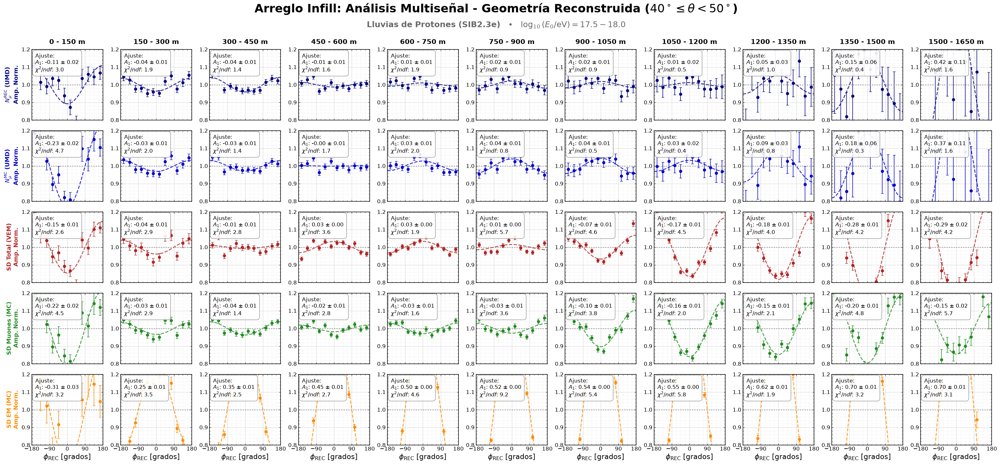

In [14]:
# =============================================================================
# EJECUCIÓN DEL GRÁFICO (Ejemplo)
# =============================================================================
bines_radiales = [0, 150, 300, 450, 600, 750, 900, 1050, 1200, 1350, 1500, 1650]
df_res_mc = explorador_grilla_multisenal_v2(df_infill, r_edges=bines_radiales, theta_min=40, theta_max=50, mode='REC')

In [15]:
# =============================================================================
# HERRAMIENTA INVESTIGATIVA: GRILLA ESTILO ANEXO (EN ESPAÑOL + METADATOS)
# =============================================================================

def explorador_grilla_multisenal_v2(df, r_edges, theta_min, theta_max, mode='MC', phi_bins=12):
    """
    Genera la grilla de N filas evaluando dinámicamente los bines radiales pasados,
    formateada para el Anexo de la tesis (todo en español, con estilo de publicación).
    """
    if mode not in ['MC', 'REC']:
        raise ValueError("El parámetro 'mode' debe ser 'MC' o 'REC'.")

    # 1. Filtro Cenital
    df_theta = df[(df['theta_MC'] >= theta_min) & (df['theta_MC'] < theta_max)].copy()
    print(f"--- Exploración: {theta_min}° <= Theta < {theta_max}° ---")
    print(f"Bines radiales a evaluar: {r_edges}")
    print(f"Eventos en rango angular: {len(df_theta):,}")
    
    if len(df_theta) == 0:
        print("No hay datos para este rango.")
        return pd.DataFrame()
        
    # 2. Preparación Geométrica
    euler_mc_true = ensure_degrees(df_theta['phi_plane_euler_MC_true_core'])
    euler_abs = (euler_mc_true - 180) % 360
    df_theta['phi_MC_Truth'] = (euler_abs + 180) % 360 - 180
    
    sp_raw = ensure_degrees(df_theta['phi_plane_sp'])
    phi_rec = ensure_degrees(df_theta['phi_REC'])
    p_rec_absoluto = (sp_raw + phi_rec) % 360
    df_theta['p_rec_cen'] = (p_rec_absoluto + 180) % 360 - 180
    
    # Interruptor Geométrico
    if mode == 'MC':
        r_col = 'r_core_MC'
        angle_col = 'phi_MC_Truth'
        print("Modo seleccionado: FULL MC (Usando Core Verdadero y Ángulos Verdaderos)")
    else:
        r_col = 'r_core'
        angle_col = 'p_rec_cen'
        print("Modo seleccionado: FULL REC (Usando Core Reconstruido y Ángulos Reconstruidos)")

    # 3. Configuración de la Grilla (Dejamos las 3 señales activas)
    n_cols = len(r_edges) - 1
    configs = [
        ('nMuones_REC', r'$N_\mu^{\mathrm{REC}}$ (UMD)', 'navy'), 
        ('nMuones_MC', r'$N_\mu^{\mathrm{MC}}$ (UMD)', 'mediumblue'),
        ('sdSignal_REC', r'SD Total (VEM)', 'firebrick')
    ]
    
    n_rows = len(configs) # <-- AHORA ES DINÁMICO
    
    # Ajustamos el alto dinámicamente según la cantidad de filas
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(3.5 * n_cols, 3.5 * n_rows + 2), sharex=True)
    
    # Manejo de dimensiones si es 1 sola columna o 1 sola fila
    if n_cols == 1: 
        axs = axs[:, np.newaxis] 
    if n_rows == 1:
        axs = axs[np.newaxis, :]
        
    phi_bin_edges = np.linspace(-180, 180, phi_bins + 1)
    phi_centers = 0.5 * (phi_bin_edges[1:] + phi_bin_edges[:-1])
    
    resultados = []
    
    for k, (col_name, label, color) in enumerate(configs):
        df_theta['r_bin'] = pd.cut(df_theta[r_col], bins=r_edges, labels=False, include_lowest=True)
        
        for j in range(n_cols):
            ax = axs[k, j]
            df_r = df_theta[df_theta['r_bin'] == j].copy()
            r_min, r_max = r_edges[j], r_edges[j+1]
            
            if df_r.empty or len(df_r.dropna(subset=[col_name])) < 15:
                ax.text(0.5, 0.5, "Baja\nEstadística", ha='center', va='center', alpha=0.5, transform=ax.transAxes, fontsize=12)
                continue
                
            df_r['bin_phi'] = pd.cut(df_r[angle_col], bins=phi_bin_edges)
            st = df_r.groupby('bin_phi', observed=False)[col_name].agg(['mean','sem'])
            
            y_means, y_errs = st['mean'].values, st['sem'].values
            norm = np.nanmean(y_means)
            
            if norm == 0 or np.isnan(norm): continue
            
            y_norm = y_means / norm
            y_err_norm = y_errs / norm
            
            # Plot de datos experimentales
            ax.errorbar(phi_centers, y_norm, yerr=y_err_norm, fmt='o', color=color, markersize=6, capsize=3, elinewidth=1.2)
            
            # Fit y Cálculo de Chi2
            valid = ~np.isnan(y_norm) & ~np.isnan(y_err_norm) & (y_err_norm > 0)
            if sum(valid) >= 5:
                try:
                    popt, pcov = curve_fit(harmonic_model, phi_centers[valid], y_norm[valid], sigma=y_err_norm[valid], absolute_sigma=True, bounds=(-2.0, 2.0))
                    A1, A1_err = popt[0], np.sqrt(np.diag(pcov))[0]
                    
                    x_smooth = np.linspace(-180, 180, 100)
                    ax.plot(x_smooth, harmonic_model(x_smooth, A1), '--', color=color, alpha=0.8, linewidth=2)
                    
                    residuals = y_norm[valid] - harmonic_model(phi_centers[valid], A1)
                    chi2_red = np.sum((residuals / y_err_norm[valid])**2) / (len(y_norm[valid]) - 1)
                    
                    # ❗️ CAJA DE ESTADÍSTICAS ESTILO REFERENCIA
                    texto = f"Ajuste:\n$A_1$: {A1:.2f} $\pm$ {A1_err:.2f}\n$\chi^2/ndf$: {chi2_red:.1f}"
                    props = dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.9, edgecolor='gray')
                    ax.text(0.05, 0.95, texto, transform=ax.transAxes, fontsize=12, va='top', bbox=props)
                    
                    resultados.append({'Mode': mode, 'Signal': col_name, 'r_min': r_min, 'r_max': r_max, 'A1': A1, 'err': A1_err, 'chi2': chi2_red})
                except:
                    pass
            
            # ❗️ ESTÉTICA Y GRILLAS ESTILO REFERENCIA
            ax.minorticks_on()
            ax.grid(True, which='major', linestyle='-', alpha=0.5)
            ax.grid(True, which='minor', linestyle=':', alpha=0.3)
            
            ax.axhline(1.0, color='gray', linestyle=':', alpha=0.8)
            ax.set_xlim(-180, 180)
            ax.set_xticks([-180, -90, 0, 90, 180])
            ax.tick_params(axis='both', which='major', labelsize=12)

            # Etiquetas en español
            if k == 0: 
                ax.set_title(f"{r_min} - {r_max} m", fontsize=15, fontweight='bold', pad=12)
            if k == n_rows - 1: # <-- AHORA ES DINÁMICO (antes decía k == 4)
                ax.set_xlabel(rf"$\phi_{{\mathrm{{{mode}}}}}$ [grados]", fontsize=16)
            if j == 0: 
                ax.set_ylabel(f"{label}\nAmp. Norm.", fontsize=13, fontweight='bold', color=color)
                
    # ❗️ TÍTULO Y ANOTACIONES FÍSICAS GLOBALES
    titulo_geom = "Geometría MC Verdadera" if mode == 'MC' else "Geometría Reconstruida"
    
    # 1. Título principal
    fig.suptitle(rf"Arreglo Infill: Análisis Multiseñal - {titulo_geom} ($ {theta_min}^\circ \leq \theta < {theta_max}^\circ $)", 
                 fontsize=26, fontweight='bold', y=0.97)
    
    # 2. Metadatos físicos como subtítulo centrado
    subtitulo = r"$\mathbf{Lluvias\ de\ Protones\ (SIB2.3e)}$   $\bullet$   $\log_{10}(E_0/\mathrm{eV}) = 17.5 - 18.0$"
    fig.text(0.5, 0.935, subtitulo, fontsize=18, va='top', ha='center', color='dimgray')

    # 3. Ajustamos el margen superior para que respire bien el encabezado
    plt.subplots_adjust(top=0.88, hspace=0.15, wspace=0.25)
    
    # Guardado automático con nombre dinámico
    plt.savefig(f'Anexo_Grilla_{mode}_{theta_min}_{theta_max}.jpg', dpi=600, bbox_inches='tight')
    plt.show()
    
    return pd.DataFrame(resultados)

--- Exploración: 40° <= Theta < 50° ---
Bines radiales a evaluar: [750, 900, 1050, 1200, 1350, 1500]
Eventos en rango angular: 168,711
Modo seleccionado: FULL REC (Usando Core Reconstruido y Ángulos Reconstruidos)


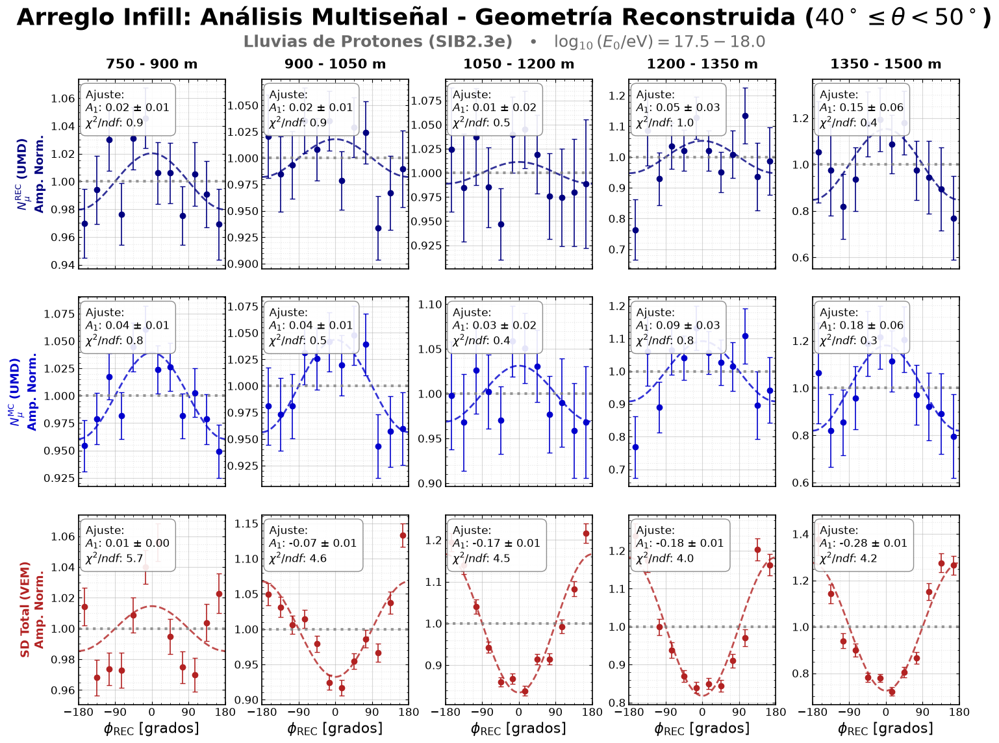

<Figure size 2400x550 with 0 Axes>

In [16]:
import matplotlib.pyplot as plt

# 1. Inyectamos "Modo Póster" a Matplotlib
plt.rcParams.update({
    'font.size': 16,
    'axes.titlesize': 20,
    'axes.labelsize': 18,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'legend.fontsize': 14,
    'lines.linewidth': 3,
    'lines.markersize': 10,
    'figure.figsize': (24, 5.5) # Fuerza el formato panorámico horizontal (1x5)
})

# 2. Corremos TU función (que sabemos que calcula bien)
bines_radiales = [750, 900, 1050, 1200, 1350, 1500]
df_res_mc = explorador_grilla_multisenal_v2(
    df_infill, 
    r_edges=bines_radiales, 
    theta_min=40, 
    theta_max=50, 
    mode='REC'
)

# 3. Guardamos con alta resolución
plt.savefig('Infill_FarCore_Survival_Poster.jpg', dpi=600, bbox_inches='tight')

# Restaurar valores por defecto para no afectar otros gráficos del notebook
plt.rcdefaults()

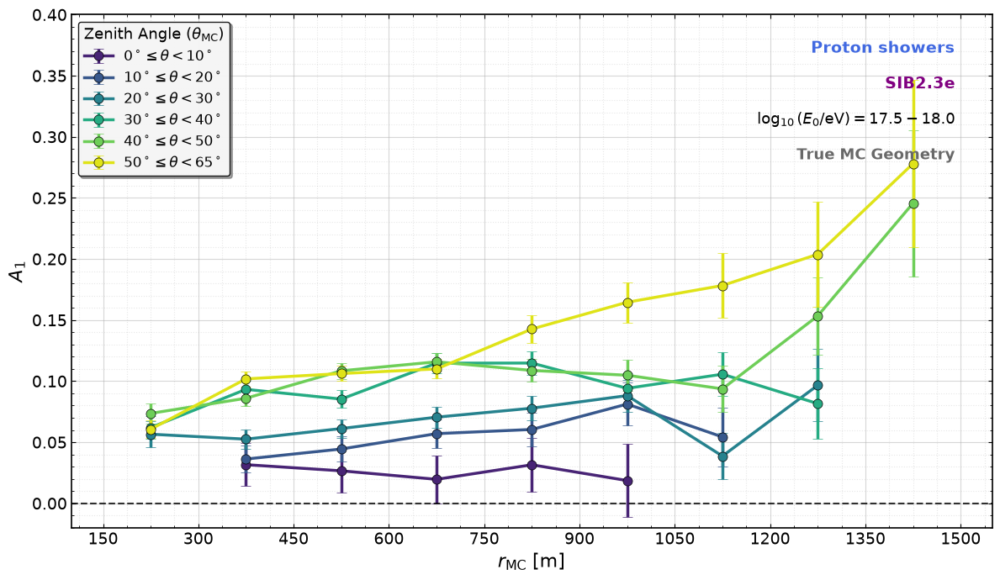

In [4]:
# =============================================================================
# CELDA: CURVAS GLOBALES DE ASIMETRÍA (A1) VS RADIO PARA DISTINTOS THETA
# =============================================================================

# 1. Definición de Bines y Mapeo Radial Específico
theta_bins = [(0, 10), (10, 20), (20, 30), (30, 40), (40, 50), (50, 65)]

# ❗️ Diccionario con los cortes radiales exactos para cada franja cenital ❗️
r_edges_dict = {
    (0, 10): np.array([300, 450, 600, 750, 900, 1050]),
    (10, 20): np.array([300, 450, 600, 750, 900, 1050, 1200]),
    (20, 30): np.array([150, 300, 450, 600, 750, 900, 1050, 1200, 1350]),
    (30, 40): np.array([150, 300, 450, 600, 750, 900, 1050, 1200, 1350]),
    (40, 50): np.array([150, 300, 450, 600, 750, 900, 1050, 1200, 1350, 1500]),
    (50, 65): np.array([150, 300, 450, 600, 750, 900, 1050, 1200, 1350, 1500])
}

# Eje X global de referencia (para los ticks del gráfico)
r_edges_global = np.arange(150, 1650, 150)

phi_bin_edges = np.linspace(-180, 180, 13)
phi_centers = 0.5 * (phi_bin_edges[1:] + phi_bin_edges[:-1])

# 2. Preparación de la Figura
fig, ax = plt.subplots(figsize=(12, 7))

# Colores secuenciales para indicar inclinación
colores = plt.cm.viridis(np.linspace(0.1, 0.95, len(theta_bins)))

# Pre-calculamos los ángulos MC absolutos
euler_mc_true = ensure_degrees(df_infill['phi_plane_euler_MC_true_core'])
euler_abs = (euler_mc_true - 180) % 360
df_infill['phi_MC_Truth'] = (euler_abs + 180) % 360 - 180

# 3. Bucle principal de cálculo y ploteo
for i, (th_min, th_max) in enumerate(theta_bins):
    df_th = df_infill[(df_infill['theta_MC'] >= th_min) & (df_infill['theta_MC'] < th_max)].copy()
    
    # Extraemos los bines radiales específicos para este ángulo
    current_r_edges = r_edges_dict[(th_min, th_max)]
    current_r_centers = 0.5 * (current_r_edges[1:] + current_r_edges[:-1])
    
    a1_vals = []
    a1_errs = []
    
    for j in range(len(current_r_edges)-1):
        r_min, r_max = current_r_edges[j], current_r_edges[j+1]
        df_r = df_th[(df_th['r_core_MC'] >= r_min) & (df_th['r_core_MC'] < r_max)].copy()
        
        A1, A1_err = np.nan, np.nan
        
        if len(df_r.dropna(subset=['nMuones_MC'])) >= 15:
            df_r['bin_phi'] = pd.cut(df_r['phi_MC_Truth'], bins=phi_bin_edges)
            st = df_r.groupby('bin_phi', observed=False)['nMuones_MC'].agg(['mean','sem'])
            
            y_means, y_errs = st['mean'].values, st['sem'].values
            norm = np.nanmean(y_means)
            
            if norm > 0 and not np.isnan(norm):
                y_norm = y_means / norm
                y_err_norm = y_errs / norm
                
                valid = ~np.isnan(y_norm) & ~np.isnan(y_err_norm) & (y_err_norm > 0)
                if sum(valid) >= 5:
                    try:
                        popt, pcov = curve_fit(harmonic_model, phi_centers[valid], y_norm[valid], 
                                               sigma=y_err_norm[valid], absolute_sigma=True, bounds=(-2.0, 2.0))
                        A1, A1_err = popt[0], np.sqrt(np.diag(pcov))[0]
                        
                        if A1_err > 0.5: 
                            A1, A1_err = np.nan, np.nan
                    except:
                        pass
                        
        a1_vals.append(A1)
        a1_errs.append(A1_err)
        
    # Plot de la curva para este bin de Theta usando sus centros radiales específicos
    label_str = rf'${th_min}^\circ \leq \theta < {th_max}^\circ$'
    ax.errorbar(current_r_centers, a1_vals, yerr=a1_errs, fmt='-o', color=colores[i], 
                label=label_str, markersize=8, linewidth=2.5, capsize=4, markeredgecolor='black', markeredgewidth=0.5)

# 4. Estética del Gráfico
ax.axhline(0, color='black', linestyle='--', linewidth=1.5, alpha=0.8)

ax.set_xlabel(r'$r_{\mathrm{MC}}$ [m]', fontsize=16)
ax.set_ylabel(r'$A_1$', fontsize=16)


ax.set_xlim(100, 1550) 
# ❗️ AGREGAMOS EL LÍMITE DE Y PARA DARLE AIRE A LAS ANOTACIONES ❗️
ax.set_ylim(-0.02, 0.40) 

# Mantenemos los ticks base para que la referencia visual sea igual para todas las curvas
ax.set_xticks(r_edges_global) 

ax.grid(True, which='major', linestyle='-', alpha=0.5)
ax.grid(True, which='minor', linestyle=':', alpha=0.3)
ax.minorticks_on()

ax.legend(title=r'Zenith Angle ($\theta_{\mathrm{MC}}$)', fontsize=12, title_fontsize=13, loc='upper left', framealpha=0.9)

ax.text(0.96, 0.95, r"$\mathbf{Proton\ showers}$", transform=ax.transAxes, fontsize=14, va='top', ha='right', color=COLORS.get('Proton', 'royalblue'))
ax.text(0.96, 0.88, r"$\mathbf{SIB2.3e}$", transform=ax.transAxes, fontsize=14, va='top', ha='right', color='purple')
ax.text(0.96, 0.81, r"$\log_{10}(E_0/\mathrm{eV}) = 17.5 - 18.0$", transform=ax.transAxes, fontsize=13, va='top', ha='right')
ax.text(0.96, 0.74, r"$\mathbf{True\ MC\ Geometry}$", transform=ax.transAxes, fontsize=13, va='top', ha='right', color='dimgray')

plt.tight_layout()
plt.savefig('Global_A1_vs_R_Theta_MC.pdf', dpi=600)
plt.show()

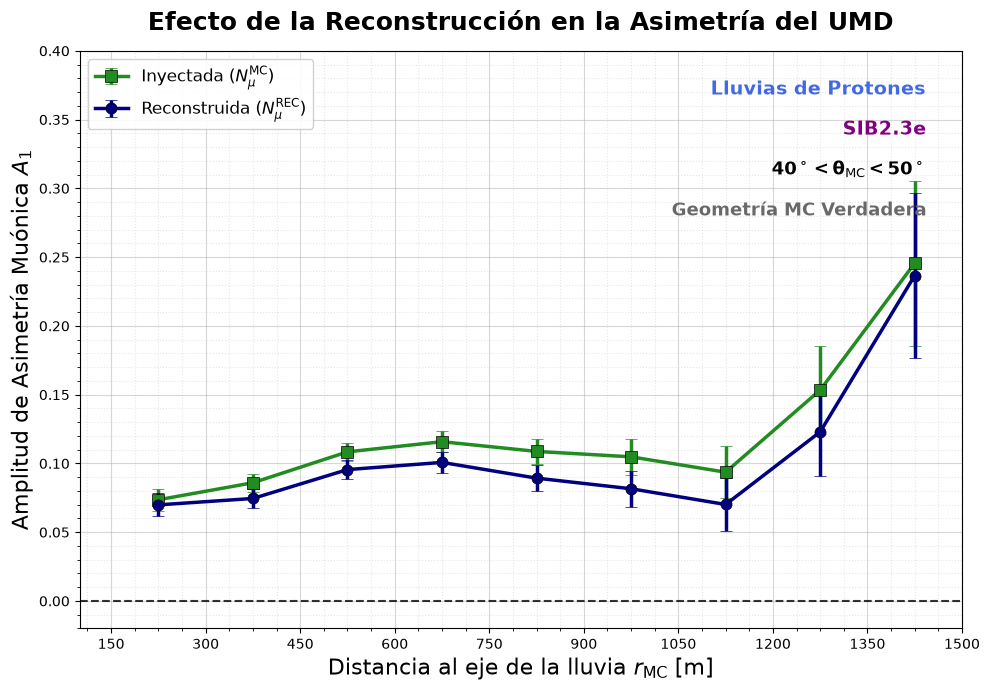

In [18]:
# =============================================================================
# CELDA: COMPARACIÓN DE ASIMETRÍA A1 (MC vs REC) - RANGO DE REFERENCIA
# =============================================================================

# 1. Configuración del rango de referencia (30-40 grados)
th_min, th_max = 40, 50
df_th = df_infill[(df_infill['theta_MC'] >= th_min) & (df_infill['theta_MC'] < th_max)].copy()

# Bines radiales específicos para este rango (siguiendo tu criterio riguroso)
r_edges = np.array([150, 300, 450, 600, 750, 900, 1050, 1200, 1350, 1500])
r_centers = 0.5 * (r_edges[1:] + r_edges[:-1])

phi_bin_edges = np.linspace(-180, 180, 13)
phi_centers = 0.5 * (phi_bin_edges[1:] + phi_bin_edges[:-1])

# Aseguramos los ángulos MC absolutos
euler_mc_true = ensure_degrees(df_th['phi_plane_euler_MC_true_core'])
euler_abs = (euler_mc_true - 180) % 360
df_th['phi_MC_Truth'] = (euler_abs + 180) % 360 - 180

# 2. Configuración de las series a comparar
signals = [
    {'col': 'nMuones_MC', 'label': r'Inyectada ($N_\mu^{\mathrm{MC}}$)', 'color': 'forestgreen', 'marker': 's'},
    {'col': 'nMuones_REC', 'label': r'Reconstruida ($N_\mu^{\mathrm{REC}}$)', 'color': 'navy', 'marker': 'o'}
]

fig, ax = plt.subplots(figsize=(10, 7))

# 3. Bucle de cálculo para las dos componentes
for sig in signals:
    col_name = sig['col']
    a1_vals = []
    a1_errs = []
    
    for j in range(len(r_edges)-1):
        r_min, r_max = r_edges[j], r_edges[j+1]
        df_r = df_th[(df_th['r_core_MC'] >= r_min) & (df_th['r_core_MC'] < r_max)].copy()
        
        A1, A1_err = np.nan, np.nan
        
        if len(df_r.dropna(subset=[col_name])) >= 15:
            df_r['bin_phi'] = pd.cut(df_r['phi_MC_Truth'], bins=phi_bin_edges)
            st = df_r.groupby('bin_phi', observed=False)[col_name].agg(['mean','sem'])
            
            y_means, y_errs = st['mean'].values, st['sem'].values
            norm = np.nanmean(y_means)
            
            if norm > 0 and not np.isnan(norm):
                y_norm = y_means / norm
                y_err_norm = y_errs / norm
                
                valid = ~np.isnan(y_norm) & ~np.isnan(y_err_norm) & (y_err_norm > 0)
                if sum(valid) >= 5:
                    try:
                        popt, pcov = curve_fit(harmonic_model, phi_centers[valid], y_norm[valid], 
                                               sigma=y_err_norm[valid], absolute_sigma=True, bounds=(-2.0, 2.0))
                        A1, A1_err = popt[0], np.sqrt(np.diag(pcov))[0]
                        if A1_err > 0.5: A1, A1_err = np.nan, np.nan
                    except:
                        pass
        
        a1_vals.append(A1)
        a1_errs.append(A1_err)
        
    ax.errorbar(r_centers, a1_vals, yerr=a1_errs, fmt=f"-{sig['marker']}", color=sig['color'],
                label=sig['label'], markersize=8, linewidth=2.5, capsize=4, markeredgecolor='black', markeredgewidth=0.5)

# 4. Estética y Formato
ax.axhline(0, color='black', linestyle='--', linewidth=1.5, alpha=0.8)

ax.set_xlabel(r'Distancia al eje de la lluvia $r_{\mathrm{MC}}$ [m]', fontsize=16)
ax.set_ylabel(r'Amplitud de Asimetría Muónica $A_1$', fontsize=16)
ax.set_title(r'Efecto de la Reconstrucción en la Asimetría del UMD', fontsize=18, fontweight='bold', pad=15)

ax.set_xlim(100, 1400)
ax.set_ylim(-0.02, 0.4)
ax.set_xticks(r_edges)

ax.grid(True, which='major', linestyle='-', alpha=0.5)
ax.grid(True, which='minor', linestyle=':', alpha=0.3)
ax.minorticks_on()

ax.legend(fontsize=12, loc='upper left', framealpha=0.9)

# Anotaciones Físicas
ax.text(0.96, 0.95, r"$\mathbf{Lluvias\ de\ Protones}$", transform=ax.transAxes, fontsize=14, va='top', ha='right', color=COLORS.get('Proton', 'royalblue'))
ax.text(0.96, 0.88, r"$\mathbf{SIB2.3e}$", transform=ax.transAxes, fontsize=14, va='top', ha='right', color='purple')
ax.text(0.96, 0.81, rf"$\mathbf{{{th_min}^\circ < \theta_{{\mathrm{{MC}}}} < {th_max}^\circ}}$", transform=ax.transAxes, fontsize=13, va='top', ha='right')
ax.text(0.96, 0.74, r"$\mathbf{Geometría\ MC\ Verdadera}$", transform=ax.transAxes, fontsize=13, va='top', ha='right', color='dimgray')

plt.tight_layout()
plt.savefig('UMD_Asymmetry_MC_vs_REC.pdf', dpi=300)
plt.show()

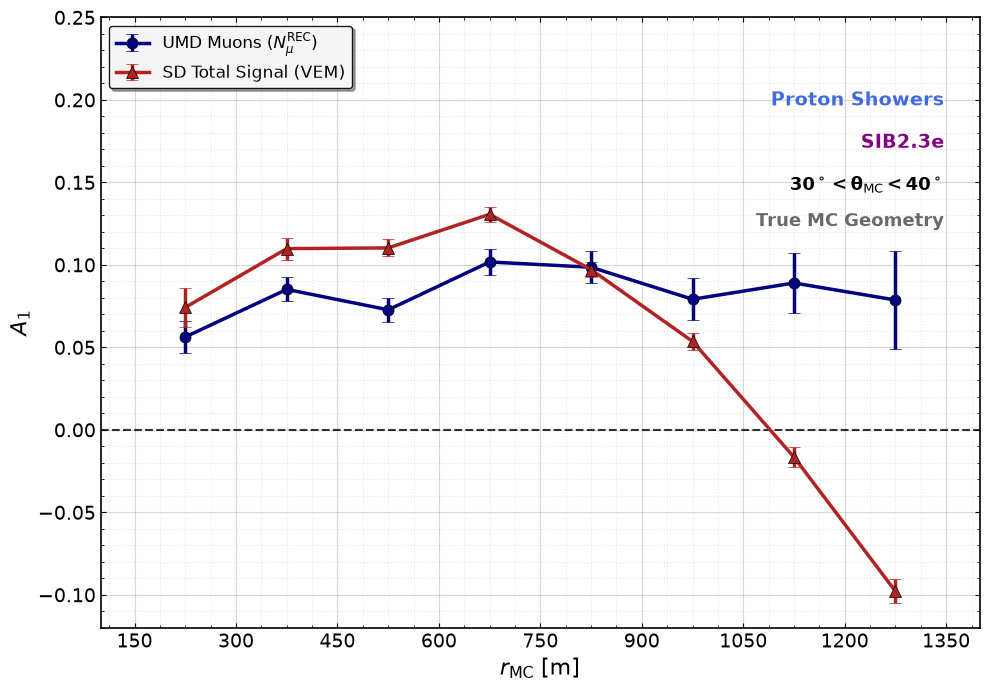

In [7]:
# =============================================================================
# CELDA: COMPETENCIA DE OBSERVABLES - UMD vs SD TOTAL (RANGO DE REFERENCIA)
# =============================================================================

# 1. Selección del rango de referencia (30-40 grados)
th_min, th_max = 30, 40
df_th = df_infill[(df_infill['theta_MC'] >= th_min) & (df_infill['theta_MC'] < th_max)].copy()

# Bines radiales específicos para este rango (hasta 1350 m según tu criterio de corte)
r_edges = np.array([150, 300, 450, 600, 750, 900, 1050, 1200, 1350])
r_centers = 0.5 * (r_edges[1:] + r_edges[:-1])

phi_bin_edges = np.linspace(-180, 180, 13)
phi_centers = 0.5 * (phi_bin_edges[1:] + phi_bin_edges[:-1])

# Aseguramos los ángulos MC absolutos para el pipeline de ajuste
euler_mc_true = ensure_degrees(df_th['phi_plane_euler_MC_true_core'])
euler_abs = (euler_mc_true - 180) % 360
df_th['phi_MC_Truth'] = (euler_abs + 180) % 360 - 180

# 2. Configuración de los dos observables a contrastar
signals = [
    #{'col': 'nMuones_MC', 'label': r'UMD Muones ($N_\mu^{\mathrm{MC}}$)', 'color': 'mediumblue', 'marker': 's'},
    {'col': 'nMuones_REC', 'label': r'UMD Muons ($N_\mu^{\mathrm{REC}}$)', 'color': 'navy', 'marker': 'o'}, # Por si preferís usar REC
    {'col': 'sdSignal_REC', 'label': r'SD Total Signal (VEM)', 'color': 'firebrick', 'marker': '^'}
]

fig, ax = plt.subplots(figsize=(10, 7))

# 3. Bucle de cálculo de asimetrías
for sig in signals:
    col_name = sig['col']
    a1_vals = []
    a1_errs = []
    
    for j in range(len(r_edges)-1):
        r_min, r_max = r_edges[j], r_edges[j+1]
        df_r = df_th[(df_th['r_core_MC'] >= r_min) & (df_th['r_core_MC'] < r_max)].copy()
        
        A1, A1_err = np.nan, np.nan
        
        if len(df_r.dropna(subset=[col_name])) >= 15:
            df_r['bin_phi'] = pd.cut(df_r['phi_MC_Truth'], bins=phi_bin_edges)
            st = df_r.groupby('bin_phi', observed=False)[col_name].agg(['mean','sem'])
            
            y_means, y_errs = st['mean'].values, st['sem'].values
            norm = np.nanmean(y_means)
            
            if norm > 0 and not np.isnan(norm):
                y_norm = y_means / norm
                y_err_norm = y_errs / norm
                
                valid = ~np.isnan(y_norm) & ~np.isnan(y_err_norm) & (y_err_norm > 0)
                if sum(valid) >= 5:
                    try:
                        popt, pcov = curve_fit(harmonic_model, phi_centers[valid], y_norm[valid], 
                                               sigma=y_err_norm[valid], absolute_sigma=True, bounds=(-2.0, 2.0))
                        A1, A1_err = popt[0], np.sqrt(np.diag(pcov))[0]
                        if A1_err > 0.5: A1, A1_err = np.nan, np.nan
                    except:
                        pass
        
        a1_vals.append(A1)
        a1_errs.append(A1_err)
        
    ax.errorbar(r_centers, a1_vals, yerr=a1_errs, fmt=f"-{sig['marker']}", color=sig['color'],
                label=sig['label'], markersize=8, linewidth=2.5, capsize=4, markeredgecolor='black', markeredgewidth=0.5)

# 4. Estética y Formato Profesional (Estilo Tesis)
ax.axhline(0, color='black', linestyle='--', linewidth=1.5, alpha=0.8)

ax.set_xlabel(r'$r_{\mathrm{MC}}$ [m]', fontsize=16)
ax.set_ylabel(r'$A_1$', fontsize=16)

ax.set_xlim(100, 1400)
# Le damos rango negativo al eje Y para que la inversión del SD se luzca sin problemas
ax.set_ylim(-0.12, 0.25)
ax.set_xticks(r_edges)

ax.grid(True, which='major', linestyle='-', alpha=0.5)
ax.grid(True, which='minor', linestyle=':', alpha=0.3)
ax.minorticks_on()

ax.legend(fontsize=12, loc='upper left', framealpha=0.9)

# Anotaciones Físicas de la simulación
ax.text(0.96, 0.88, r"$\mathbf{Proton\ Showers}$", transform=ax.transAxes, fontsize=14, va='top', ha='right', color=COLORS.get('Proton', 'royalblue'))
ax.text(0.96, 0.81, r"$\mathbf{SIB2.3e}$", transform=ax.transAxes, fontsize=14, va='top', ha='right', color='purple')
ax.text(0.96, 0.74, rf"$\mathbf{{{th_min}^\circ < \theta_{{\mathrm{{MC}}}} < {th_max}^\circ}}$", transform=ax.transAxes, fontsize=13, va='top', ha='right')
ax.text(0.96, 0.68, r"$\mathbf{True\ MC\ Geometry}$", transform=ax.transAxes, fontsize=13, va='top', ha='right', color='dimgray')

plt.tight_layout()
plt.savefig('UMD_vs_SD_Total_Asymmetry.pdf', dpi=300)
plt.show()

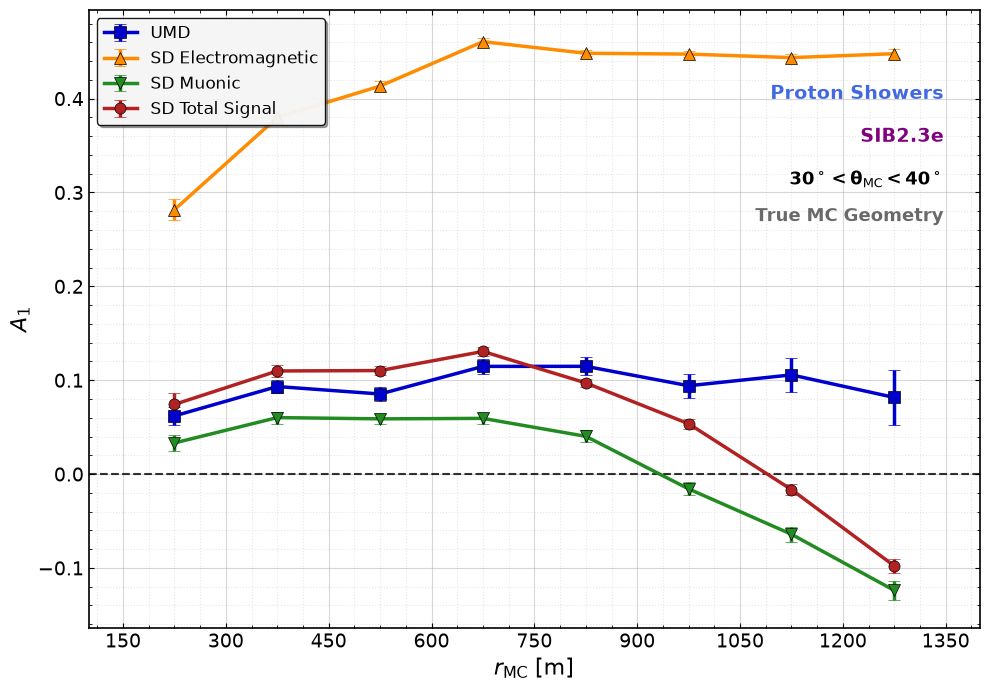

In [4]:
# =============================================================================
# CELDA: DESGLOSE DE SEÑALES DEL SD (EM vs MUONES) FRENTE AL UMD
# =============================================================================

# 1. Selección del rango de referencia (30-40 grados)
th_min, th_max = 30, 40
df_th = df_infill[(df_infill['theta_MC'] >= th_min) & (df_infill['theta_MC'] < th_max)].copy()

# Bines radiales específicos
r_edges = np.array([150, 300, 450, 600, 750, 900, 1050, 1200, 1350])
r_centers = 0.5 * (r_edges[1:] + r_edges[:-1])

phi_bin_edges = np.linspace(-180, 180, 13)
phi_centers = 0.5 * (phi_bin_edges[1:] + phi_bin_edges[:-1])

# Aseguramos los ángulos MC absolutos
euler_mc_true = ensure_degrees(df_th['phi_plane_euler_MC_true_core'])
euler_abs = (euler_mc_true - 180) % 360
df_th['phi_MC_Truth'] = (euler_abs + 180) % 360 - 180

# 2. Configuración de las tres poblaciones a contrastar
signals = [
    {'col': 'nMuones_MC', 'label': r'UMD', 'color': 'mediumblue', 'marker': 's'},
    {'col': 'sd_nEM_MC', 'label': r'SD Electromagnetic', 'color': 'darkorange', 'marker': '^'},
    {'col': 'sd_nMuons_MC', 'label': r'SD Muonic', 'color': 'forestgreen', 'marker': 'v'},
    {'col': 'sdSignal_REC', 'label': r'SD Total Signal', 'color': 'firebrick', 'marker': 'o'}
]

fig, ax = plt.subplots(figsize=(10, 7))

# 3. Bucle de cálculo de asimetrías
for sig in signals:
    col_name = sig['col']
    a1_vals = []
    a1_errs = []
    
    for j in range(len(r_edges)-1):
        r_min, r_max = r_edges[j], r_edges[j+1]
        df_r = df_th[(df_th['r_core_MC'] >= r_min) & (df_th['r_core_MC'] < r_max)].copy()
        
        A1, A1_err = np.nan, np.nan
        
        if len(df_r.dropna(subset=[col_name])) >= 15:
            df_r['bin_phi'] = pd.cut(df_r['phi_MC_Truth'], bins=phi_bin_edges)
            st = df_r.groupby('bin_phi', observed=False)[col_name].agg(['mean','sem'])
            
            y_means, y_errs = st['mean'].values, st['sem'].values
            norm = np.nanmean(y_means)
            
            if norm > 0 and not np.isnan(norm):
                y_norm = y_means / norm
                y_err_norm = y_errs / norm
                
                valid = ~np.isnan(y_norm) & ~np.isnan(y_err_norm) & (y_err_norm > 0)
                if sum(valid) >= 5:
                    try:
                        popt, pcov = curve_fit(harmonic_model, phi_centers[valid], y_norm[valid], 
                                               sigma=y_err_norm[valid], absolute_sigma=True, bounds=(-2.0, 2.0))
                        A1, A1_err = popt[0], np.sqrt(np.diag(pcov))[0]
                        if A1_err > 0.5: A1, A1_err = np.nan, np.nan
                    except:
                        pass
        
        a1_vals.append(A1)
        a1_errs.append(A1_err)
        
    ax.errorbar(r_centers, a1_vals, yerr=a1_errs, fmt=f"-{sig['marker']}", color=sig['color'],
                label=sig['label'], markersize=8, linewidth=2.5, capsize=4, markeredgecolor='black', markeredgewidth=0.5)

# 4. Estética y Formato Profesional
ax.axhline(0, color='black', linestyle='--', linewidth=1.5, alpha=0.8)

ax.set_xlabel(r'$r_{\mathrm{MC}}$ [m]', fontsize=16)
ax.set_ylabel(r'$A_1$', fontsize=16)

ax.set_xlim(100, 1400)
# Ampliamos el límite inferior para que la curva verde (muones SD) se vea completa y profunda
#ax.set_ylim(-0.15, 0.25)
ax.set_xticks(r_edges)

ax.grid(True, which='major', linestyle='-', alpha=0.5)
ax.grid(True, which='minor', linestyle=':', alpha=0.3)
ax.minorticks_on()

# Leyenda ubicada para que no pise las curvas
ax.legend(fontsize=12, loc='upper left', framealpha=0.9)

# Anotaciones Físicas de la simulación
ax.text(0.96, 0.88, r"$\mathbf{Proton\ Showers}$", transform=ax.transAxes, fontsize=14, va='top', ha='right', color=COLORS.get('Proton', 'royalblue'))
ax.text(0.96, 0.81, r"$\mathbf{SIB2.3e}$", transform=ax.transAxes, fontsize=14, va='top', ha='right', color='purple')
ax.text(0.96, 0.74, rf"$\mathbf{{{th_min}^\circ < \theta_{{\mathrm{{MC}}}} < {th_max}^\circ}}$", transform=ax.transAxes, fontsize=13, va='top', ha='right')
ax.text(0.96, 0.68, r"$\mathbf{True\ MC\ Geometry}$", transform=ax.transAxes, fontsize=13, va='top', ha='right', color='dimgray')

plt.tight_layout()
plt.savefig('SD_Desglose_Componentes_vs_UMD.pdf', dpi=300)
plt.show()

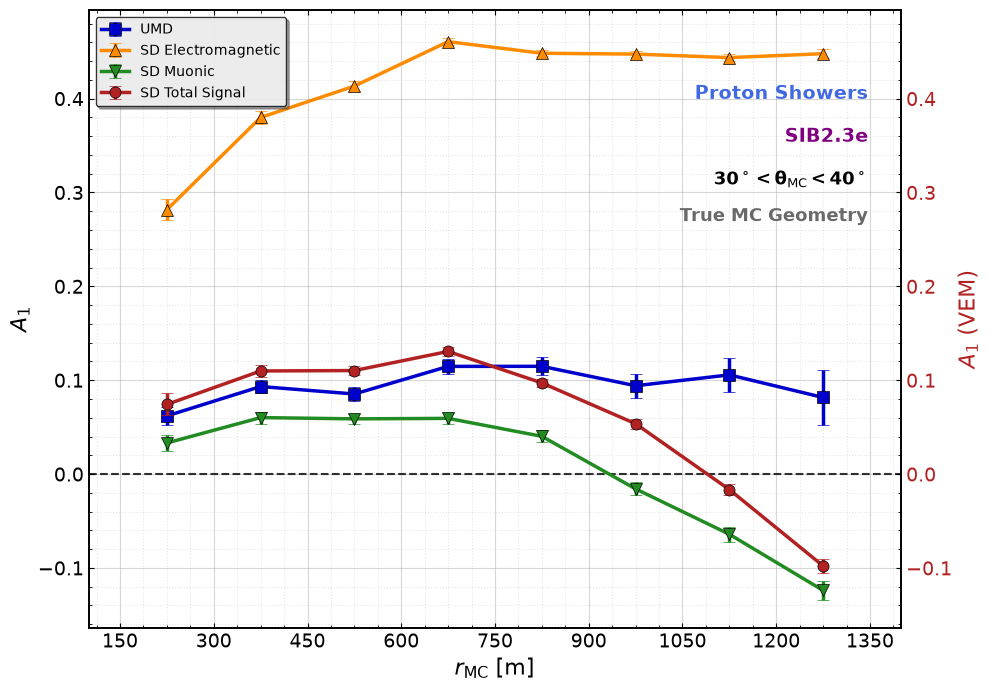

In [6]:
# =============================================================================
# CELDA: DESGLOSE DE SEÑALES DEL SD (EM vs MUONES) FRENTE AL UMD (DOBLE EJE Y)
# =============================================================================

# 1. Selección del rango de referencia (30-40 grados)
th_min, th_max = 30, 40
df_th = df_infill[(df_infill['theta_MC'] >= th_min) & (df_infill['theta_MC'] < th_max)].copy()

# Bines radiales específicos
r_edges = np.array([150, 300, 450, 600, 750, 900, 1050, 1200, 1350])
r_centers = 0.5 * (r_edges[1:] + r_edges[:-1])

phi_bin_edges = np.linspace(-180, 180, 13)
phi_centers = 0.5 * (phi_bin_edges[1:] + phi_bin_edges[:-1])

# Aseguramos los ángulos MC absolutos
euler_mc_true = ensure_degrees(df_th['phi_plane_euler_MC_true_core'])
euler_abs = (euler_mc_true - 180) % 360
df_th['phi_MC_Truth'] = (euler_abs + 180) % 360 - 180

# 2. Configuración de las tres poblaciones a contrastar
signals = [
    {'col': 'nMuones_MC', 'label': r'UMD', 'color': 'mediumblue', 'marker': 's'},
    {'col': 'sd_nEM_MC', 'label': r'SD Electromagnetic', 'color': 'darkorange', 'marker': '^'},
    {'col': 'sd_nMuons_MC', 'label': r'SD Muonic', 'color': 'forestgreen', 'marker': 'v'},
    {'col': 'sdSignal_REC', 'label': r'SD Total Signal', 'color': 'firebrick', 'marker': 'o'}
]

fig, ax1 = plt.subplots(figsize=(10, 7))
ax2 = ax1.twinx() # Creamos el segundo eje Y

# Para guardar las líneas y armar una leyenda unificada
lines = []
labels = []

# 3. Bucle de cálculo de asimetrías
for sig in signals:
    col_name = sig['col']
    a1_vals = []
    a1_errs = []
    
    for j in range(len(r_edges)-1):
        r_min, r_max = r_edges[j], r_edges[j+1]
        df_r = df_th[(df_th['r_core_MC'] >= r_min) & (df_th['r_core_MC'] < r_max)].copy()
        
        A1, A1_err = np.nan, np.nan
        
        if len(df_r.dropna(subset=[col_name])) >= 15:
            df_r['bin_phi'] = pd.cut(df_r['phi_MC_Truth'], bins=phi_bin_edges)
            st = df_r.groupby('bin_phi', observed=False)[col_name].agg(['mean','sem'])
            
            y_means, y_errs = st['mean'].values, st['sem'].values
            norm = np.nanmean(y_means)
            
            if norm > 0 and not np.isnan(norm):
                y_norm = y_means / norm
                y_err_norm = y_errs / norm
                
                valid = ~np.isnan(y_norm) & ~np.isnan(y_err_norm) & (y_err_norm > 0)
                if sum(valid) >= 5:
                    try:
                        popt, pcov = curve_fit(harmonic_model, phi_centers[valid], y_norm[valid], 
                                               sigma=y_err_norm[valid], absolute_sigma=True, bounds=(-2.0, 2.0))
                        A1, A1_err = popt[0], np.sqrt(np.diag(pcov))[0]
                        if A1_err > 0.5: A1, A1_err = np.nan, np.nan
                    except:
                        pass
        
        a1_vals.append(A1)
        a1_errs.append(A1_err)
        
    # Asignamos el eje correspondiente según la señal
    current_ax = ax2 if col_name == 'sdSignal_REC' else ax1
    
    line = current_ax.errorbar(r_centers, a1_vals, yerr=a1_errs, fmt=f"-{sig['marker']}", color=sig['color'],
                               markersize=8, linewidth=2.5, capsize=4, markeredgecolor='black', markeredgewidth=0.5)
    
    lines.append(line)
    labels.append(sig['label'])

# 4. Estética y Formato Profesional
ax1.axhline(0, color='black', linestyle='--', linewidth=1.5, alpha=0.8)

ax1.set_xlabel(r'$r_{\mathrm{MC}}$ [m]', fontsize=16)
ax1.set_ylabel(r'$A_1$', fontsize=16)
ax2.set_ylabel(r'$A_1$ (VEM)', fontsize=16, color='firebrick')

# Le damos color a los ticks del eje secundario para que resalte
ax2.tick_params(axis='y', labelcolor='firebrick')

ax1.set_xlim(100, 1400)
ax1.set_xticks(r_edges)

# ¡MUY IMPORTANTE! Sincronizamos los límites de ambos ejes Y
# Obtenemos los límites automáticos de ambos ejes y fijamos el mínimo global y máximo global
ylim1 = ax1.get_ylim()
ylim2 = ax2.get_ylim()
global_min = min(ylim1[0], ylim2[0], -0.15) # Aseguramos que se vea la inversión profunda
global_max = max(ylim1[1], ylim2[1], 0.25)

ax1.set_ylim(global_min, global_max)
ax2.set_ylim(global_min, global_max)

ax1.grid(True, which='major', linestyle='-', alpha=0.5)
ax1.grid(True, which='minor', linestyle=':', alpha=0.3)
ax1.minorticks_on()

# Leyenda unificada para ambos ejes
ax1.legend(lines, labels, fontsize=10, loc='upper left', framealpha=0.8)

# Anotaciones Físicas de la simulación
ax1.text(0.96, 0.88, r"$\mathbf{Proton\ Showers}$", transform=ax1.transAxes, fontsize=14, va='top', ha='right', color=COLORS.get('Proton', 'royalblue'))
ax1.text(0.96, 0.81, r"$\mathbf{SIB2.3e}$", transform=ax1.transAxes, fontsize=14, va='top', ha='right', color='purple')
ax1.text(0.96, 0.74, rf"$\mathbf{{{th_min}^\circ < \theta_{{\mathrm{{MC}}}} < {th_max}^\circ}}$", transform=ax1.transAxes, fontsize=13, va='top', ha='right')
ax1.text(0.96, 0.68, r"$\mathbf{True\ MC\ Geometry}$", transform=ax1.transAxes, fontsize=13, va='top', ha='right', color='dimgray')

plt.tight_layout()
plt.savefig('SD_Desglose_Componentes_vs_UMD_TwinAxes.pdf', dpi=300)
plt.show()